In [159]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import MSTL
from scipy.signal import butter, filtfilt

In [110]:
df = pd.read_csv('ristoranti.csv', sep=';')
df

,data,scontrini,totale,ristorante
0,20180101,21884.0,578251.44,R001
1,20180101,28101.0,904541.04,R002
2,20180101,19961.0,291457.92,R003
3,20180101,23173.0,596765.52,R004
4,20180101,19541.0,471594.24,R005
...,...,...,...,...
13379,20240531,0.0,0.00,R002
13380,20240531,0.0,0.00,R003
13381,20240531,0.0,0.00,R004
13382,20240531,0.0,0.00,R005


In [111]:
df['data'] = pd.to_datetime(df['data'].astype(str), format='%Y%m%d')
df["giorno"] = df["data"].dt.day_name()
df.head()

,data,scontrini,totale,ristorante,giorno
0,2018-01-01,21884.0,578251.44,R001,Monday
1,2018-01-01,28101.0,904541.04,R002,Monday
2,2018-01-01,19961.0,291457.92,R003,Monday
3,2018-01-01,23173.0,596765.52,R004,Monday
4,2018-01-01,19541.0,471594.24,R005,Monday


In [112]:
df['scontrino_medio'] = df.totale / df.scontrini
df.fillna(value=0, inplace=True)
df.head()

,data,scontrini,totale,ristorante,giorno,scontrino_medio
0,2018-01-01,21884.0,578251.44,R001,Monday,26.423480
1,2018-01-01,28101.0,904541.04,R002,Monday,32.188927
2,2018-01-01,19961.0,291457.92,R003,Monday,14.601369
3,2018-01-01,23173.0,596765.52,R004,Monday,25.752622
4,2018-01-01,19541.0,471594.24,R005,Monday,24.133578


In [113]:
len(df[df['scontrini'] == 0]) / len(df)

0.13247160789001794

In [114]:
df.isna().sum()

data               0
scontrini          0
totale             0
ristorante         0
giorno             0
scontrino_medio    0
dtype: int64

In [115]:
print(df.groupby('ristorante').size())

ristorante
R001    2343
R002    2343
R003    2343
R004    2343
R005    2338
R067    1674
dtype: int64


In [116]:
restaurants = df['ristorante'].unique()
dfs = {f"df{i}": pd.DataFrame() for i in range(1, 7)}
i = 1

for r in restaurants:
    dfs[f"df{i}"] = df[df['ristorante'] == r]
    i += 1

In [117]:
for name, d in dfs.items():
    
    #d = d[d.data >= "2018-09-01"]
    zero_days = (
        d[d["totale"] == 0]
        .groupby("giorno")["data"]
        .count()
        .sort_values(ascending=False)
    )
    print(name,':', zero_days, '\n')

df1 : giorno
Friday       48
Monday       46
Saturday     46
Sunday       45
Thursday     45
Tuesday      45
Wednesday    45
Name: data, dtype: int64 

df2 : giorno
Tuesday      54
Friday       50
Monday       48
Saturday     48
Thursday     48
Sunday       47
Wednesday    47
Name: data, dtype: int64 

df3 : giorno
Monday       58
Sunday       58
Saturday     53
Tuesday      53
Thursday     51
Friday       50
Wednesday    50
Name: data, dtype: int64 

df4 : giorno
Friday       47
Saturday     45
Thursday     45
Monday       44
Sunday       44
Tuesday      44
Wednesday    43
Name: data, dtype: int64 

df5 : giorno
Friday       46
Saturday     45
Sunday       44
Thursday     44
Monday       43
Tuesday      43
Wednesday    42
Name: data, dtype: int64 

df6 : giorno
Monday       20
Friday       15
Thursday     14
Saturday     13
Sunday       13
Tuesday      12
Wednesday    12
Name: data, dtype: int64 



In [118]:
full_range = pd.date_range(df["data"].min(), df["data"].max(), freq="D")
for name, d in dfs.items():
    d = d.copy()
    
    
    d = d.set_index("data")
    d = d.reindex(full_range)
    d["data"] = d.index
    d["ristorante"] = d["ristorante"].ffill().bfill()  
    d["scontrini"] = d["scontrini"].fillna(0)
    d["totale"] = d["totale"].fillna(0)
    
    dfs[name] = d.reset_index(drop=True)

In [119]:
for name, d in dfs.items():
    num_dupes = d["data"].duplicated().sum()
    print(f"{name}: {num_dupes} dates duplicated")

df1: 0 dates duplicated
df2: 0 dates duplicated
df3: 0 dates duplicated
df4: 0 dates duplicated
df5: 0 dates duplicated
df6: 0 dates duplicated


In [120]:
def plot_dfs(dfs, variable, starting_date=None):
    fig, axes = plt.subplots(3, 2, figsize=(14, 10), sharex=True)
    axes = axes.flatten()  

    for i, (name, df) in enumerate(dfs.items()):
        ax = axes[i]
        df = df.copy()
        df["data"] = pd.to_datetime(df["data"])
        
        if starting_date is not None:
            df = df[df["data"] >= starting_date]

        y = df[variable].astype(float).values.flatten()

        ax.plot(df["data"].values, y, label=f"{name} - {df['ristorante'].iloc[0]}")
        ax.set_title(f"{df['ristorante'].iloc[0]}", fontsize=10)
        ax.set_ylabel(variable)
        ax.legend(loc="upper right", fontsize=8)
        ax.grid(True, alpha=0.3)

    axes[-1].set_xlabel("Dats")
    plt.tight_layout()
    plt.show()

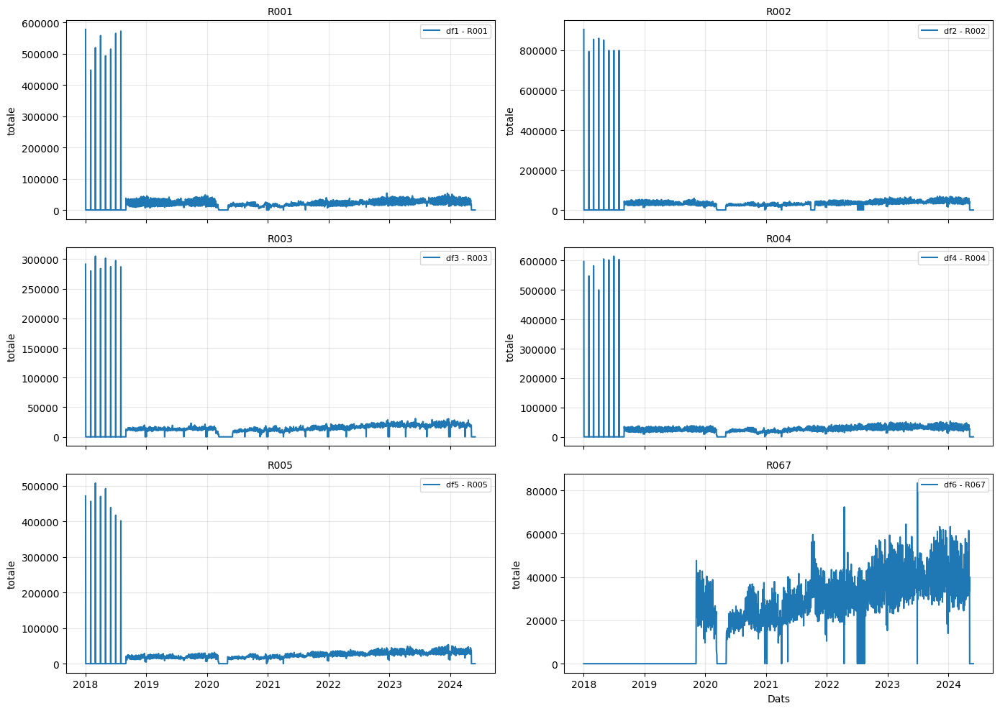

In [121]:
plot_dfs(dfs, 'totale')

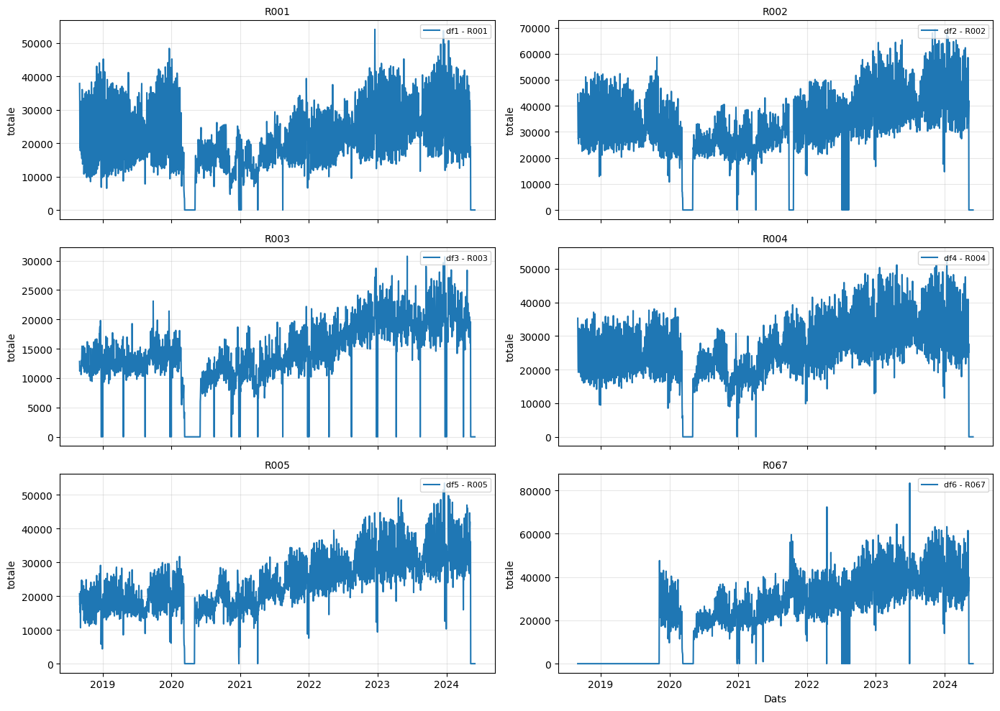

In [122]:
plot_dfs(dfs, 'totale', "2018-09-01")

In [123]:
dfs['df1'][dfs['df1'].totale == 0].to_csv('chiusure_r01.csv')

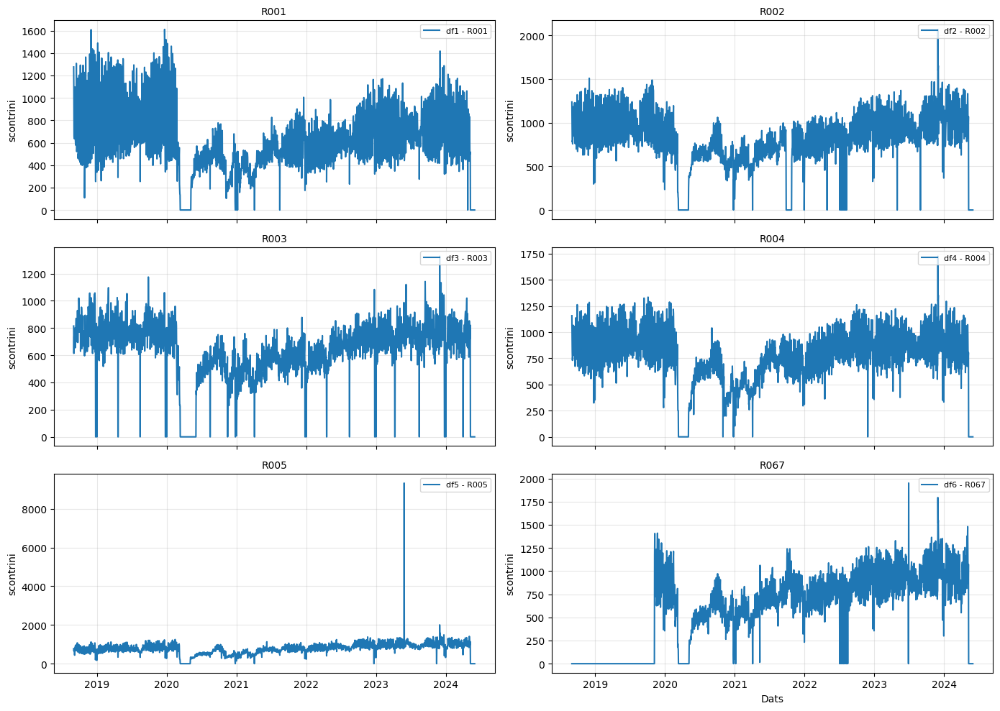

In [124]:
plot_dfs(dfs, 'scontrini', "2018-09-01")

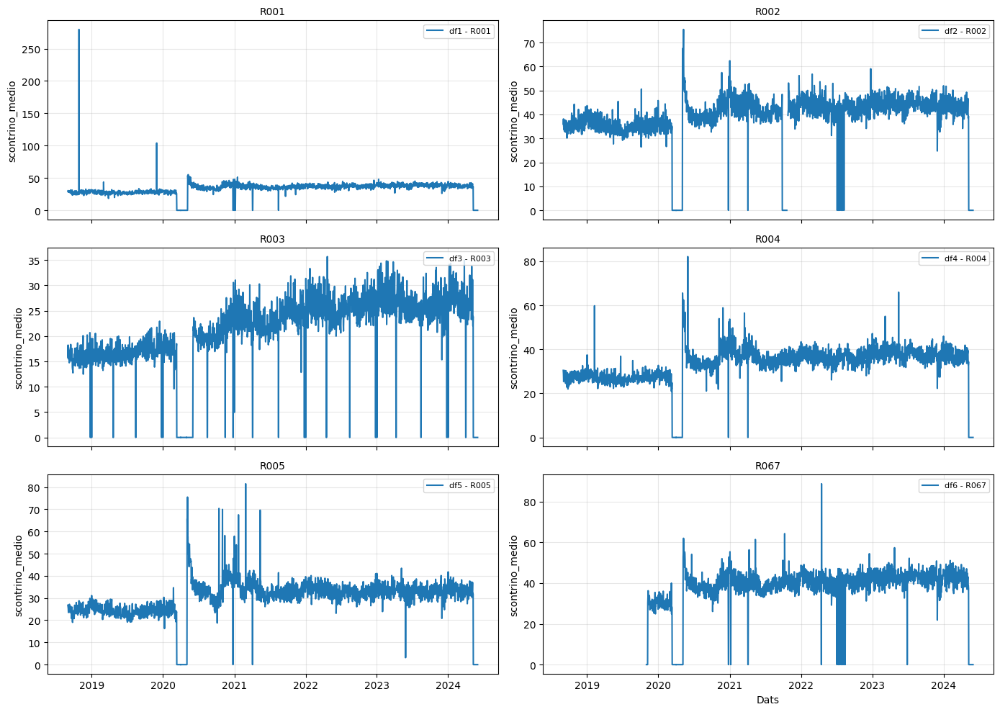

In [125]:
plot_dfs(dfs, 'scontrino_medio', "2018-09-01")

# SEASONALITY 1

In [126]:
def analyze_multiseasonality(
    df,
    value_col="totale",
    date_col="data",
    title="Multi-Seasonal Decomposition (Daily Data)",
    start_date=None,
    end_date=None,
    year=None,
    periods=(7, 30, 365),
):
    
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])
    df = df.sort_values(date_col).set_index(date_col)
    df[value_col] = df[value_col].interpolate(method="linear")

    
    if start_date:
        df = df[df.index >= pd.to_datetime(start_date)]
    if end_date:
        df = df[df.index <= pd.to_datetime(end_date)]


    if isinstance(periods, (int, float)):
        periods = (periods,)
    elif isinstance(periods, list):
        periods = tuple(periods)

    mstl = MSTL(df[value_col], periods=periods)
    res = mstl.fit()
    seasonal = np.asarray(res.seasonal) 
    df["Trend"] = np.asarray(res.trend, dtype=float).reshape(-1)

    if seasonal.ndim == 1:
        df["Weekly_Seasonality"] = seasonal.astype(float).reshape(-1)
        df["Monthly_Seasonality"] = 0.0
        df["Yearly_Seasonality"] = 0.0
    else:
        n_components = seasonal.shape[1]
        names = ["Weekly_Seasonality", "Monthly_Seasonality", "Yearly_Seasonality"]
        for i in range(min(3, n_components)):
            df[names[i]] = seasonal[:, i].astype(float).reshape(-1)
        for j in range(n_components, 3):
            df[names[j]] = 0.0

    df["Residual"] = np.asarray(res.resid, dtype=float).reshape(-1)


    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharex=True)
    axes = axes.flatten()

    plots = [
        (value_col, "Original Data"),
        ("Trend", "Trend (Long-Term)"),
        ("Weekly_Seasonality", "Weekly Seasonality (~7 days)"),
        ("Monthly_Seasonality", "Monthly Seasonality (~30 days)"),
        ("Yearly_Seasonality", "Yearly Seasonality (~365 days)"),
        ("Residual", "Residual (Unexplained)")
    ]

    for ax, (col, subtitle) in zip(axes, plots):
        y = np.asarray(df[col], dtype=float).reshape(-1)
        x = np.asarray(df.index)
        ax.plot(x, y, color="tab:blue", linewidth=1)
        if year is not None:
            ax.set_xlim(pd.Timestamp(f"{year}-01-01"), pd.Timestamp(f"{year}-12-31"))
        ax.set_title(subtitle, fontsize=11, fontweight="bold")
        ax.grid(True, linestyle="--", alpha=0.4)

    fig_title = title
    if year:
        fig_title += f" – {year}"
    fig.suptitle(fig_title, fontsize=14, fontweight="bold")

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    return df


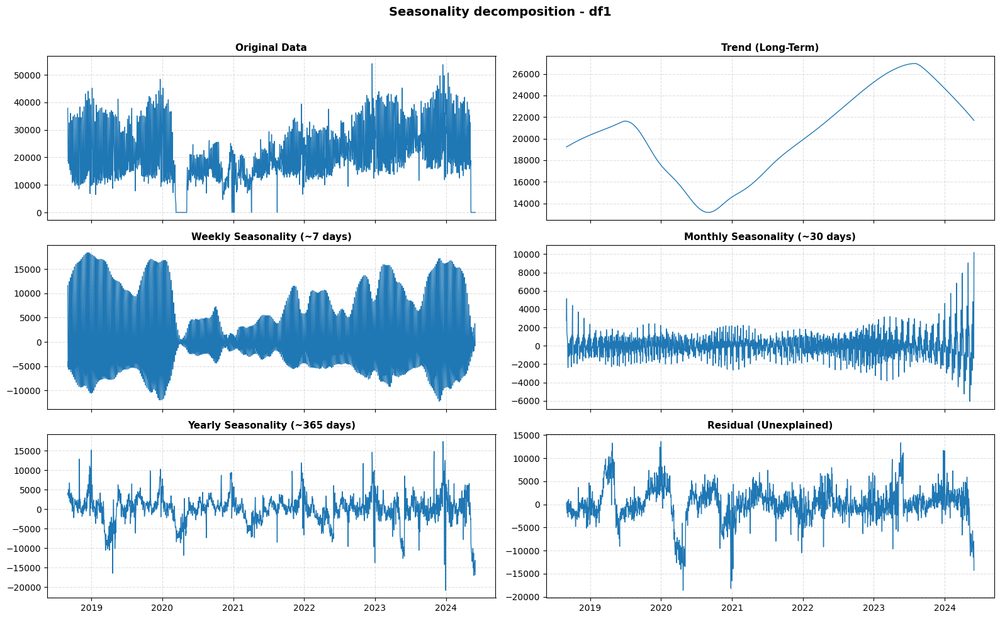

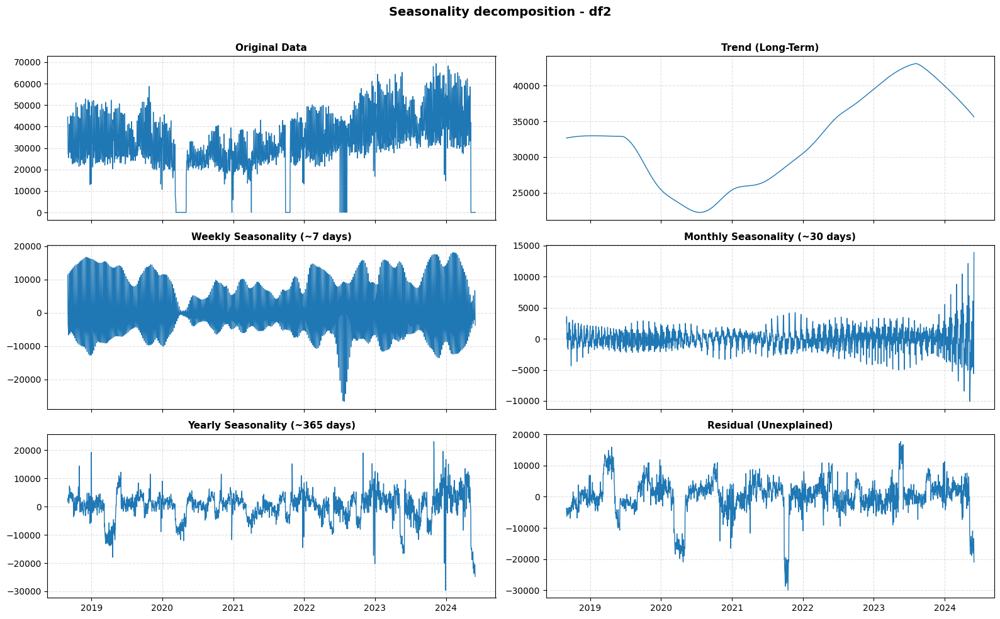

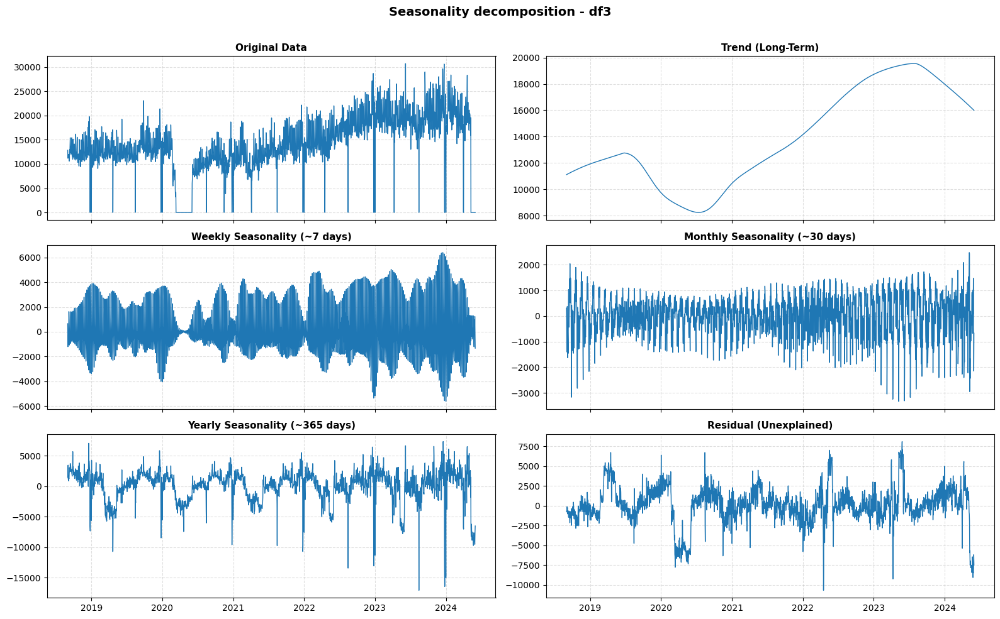

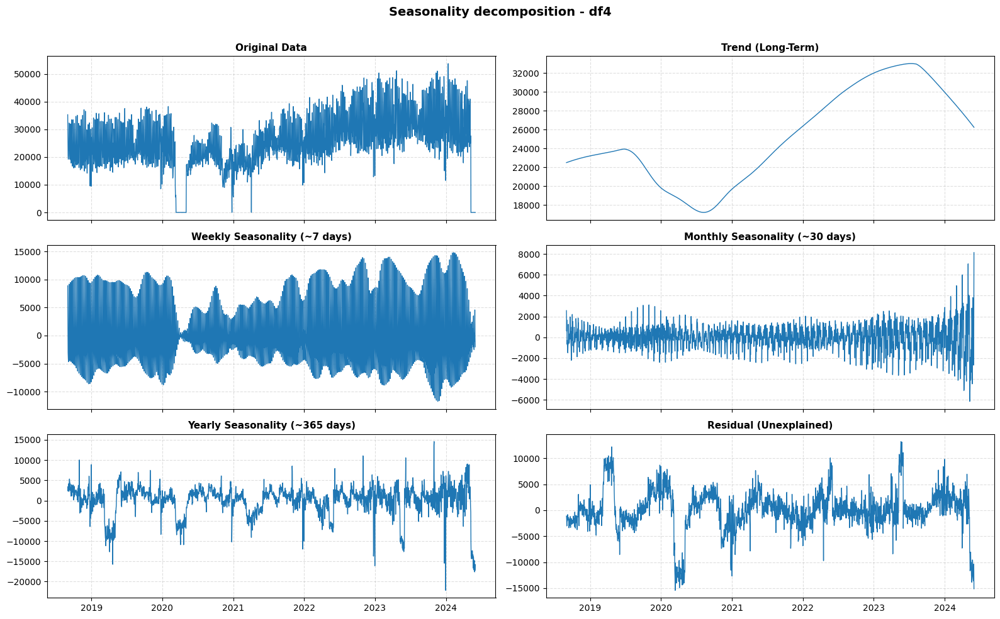

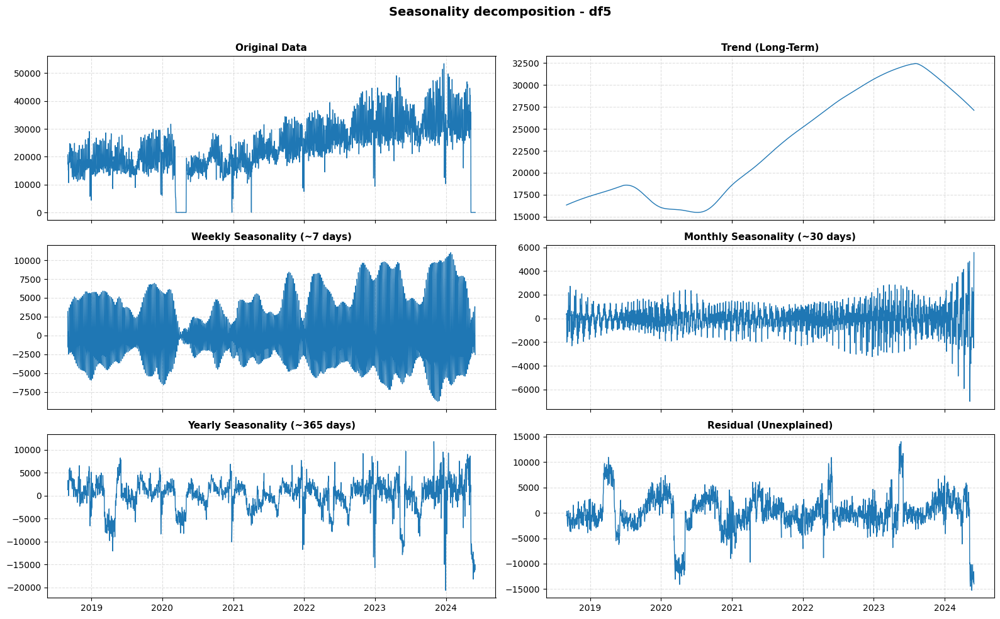

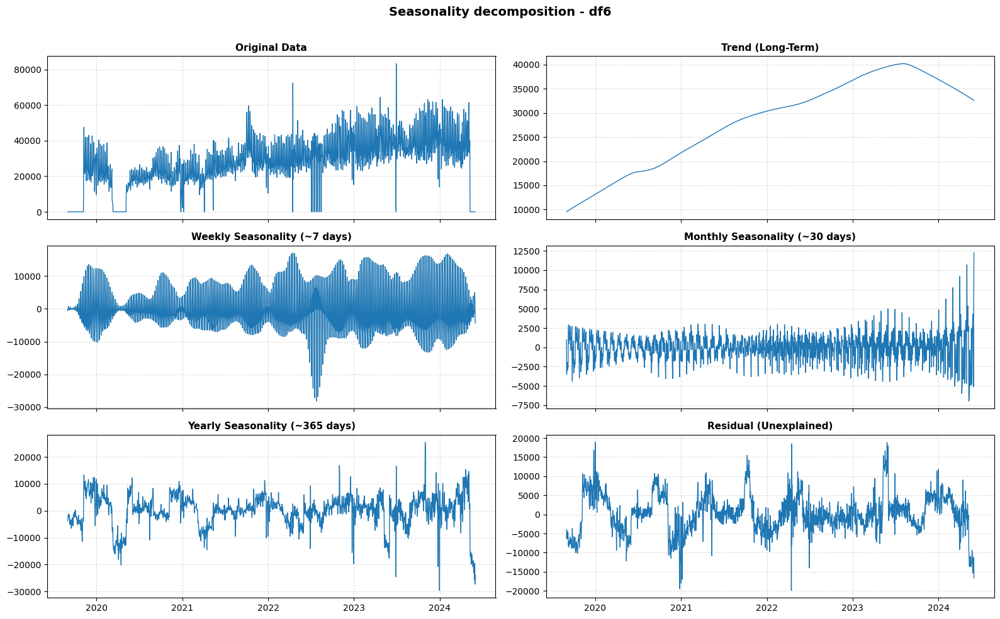

In [127]:
for name, d in dfs.items():
    if name != 'df6':
        start = "2018-09-01"
        #start = "2022-01-01"
    else:
        start = "2019-09-01"
        
    analyze_multiseasonality(
            d,
            value_col="totale",
            date_col="data",
            start_date=start,
            title=f"Seasonality decomposition - {name}"
    )

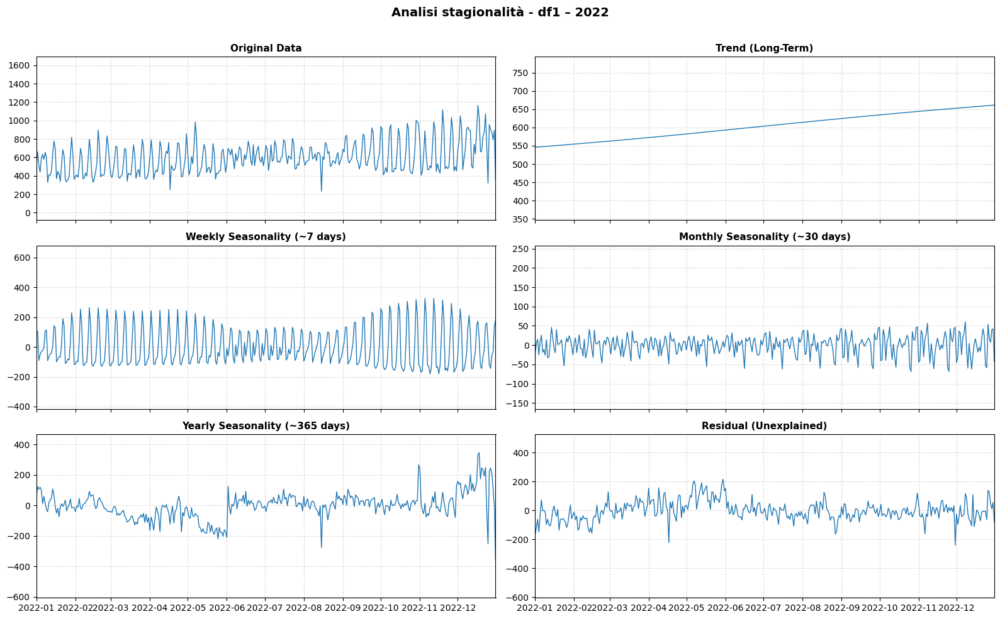

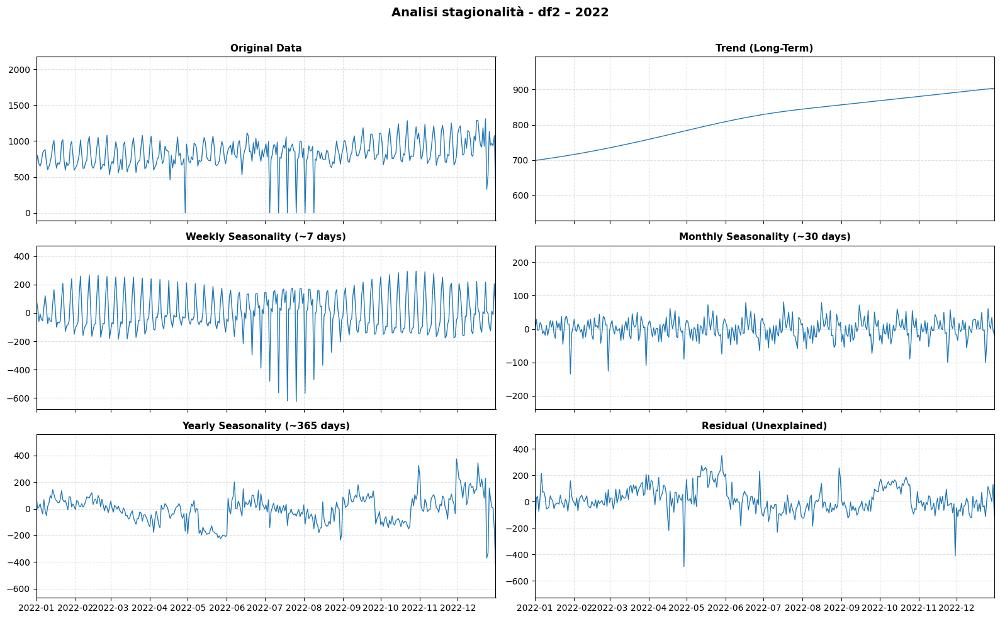

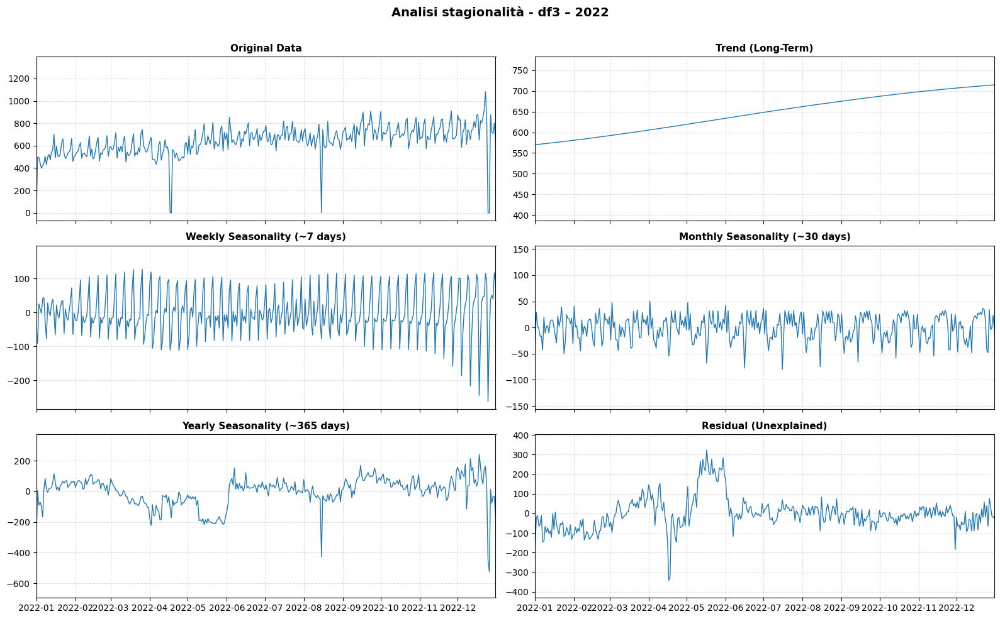

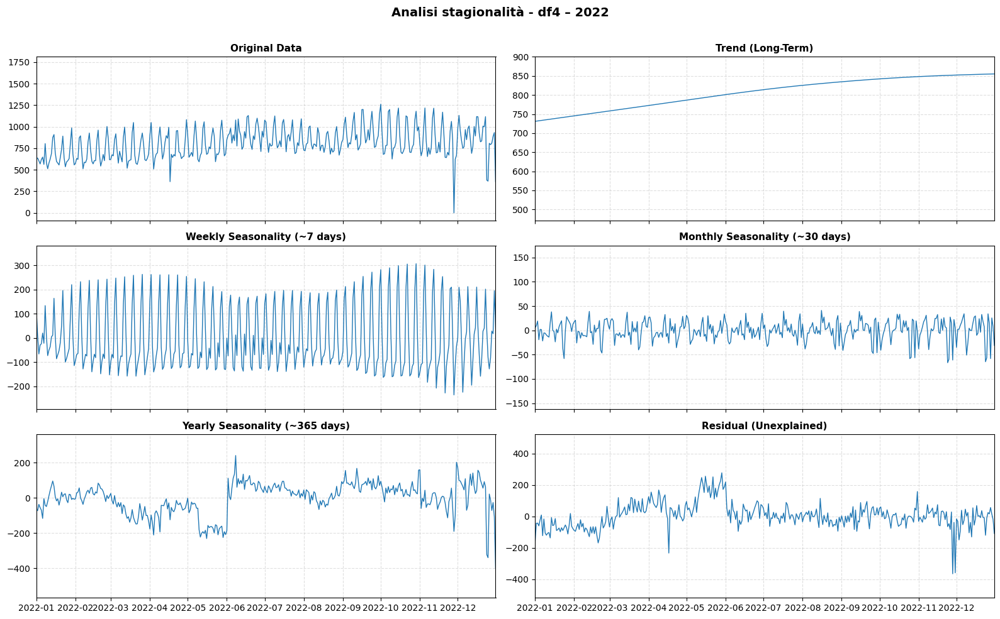

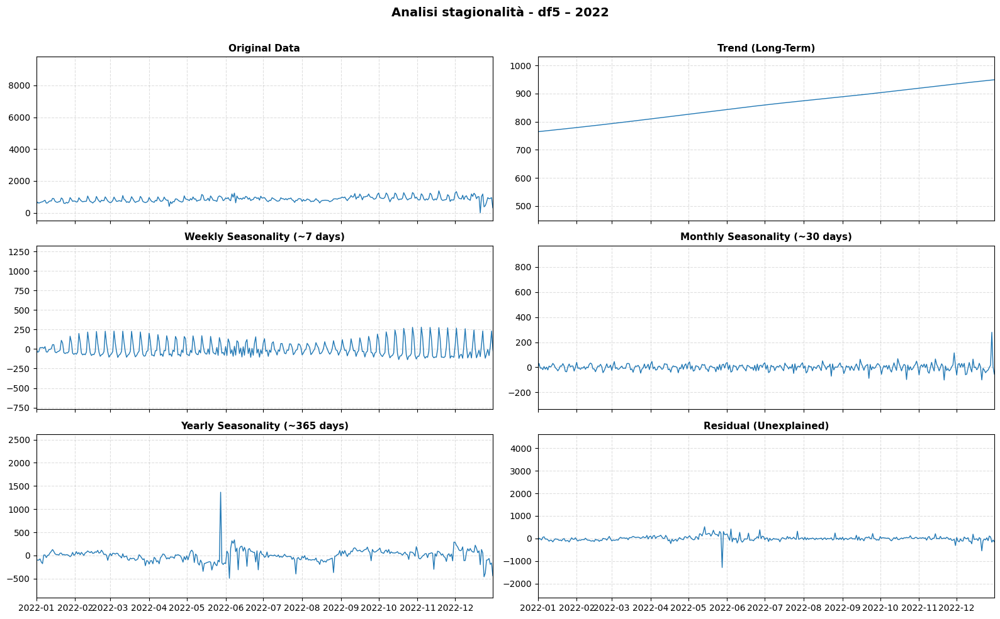

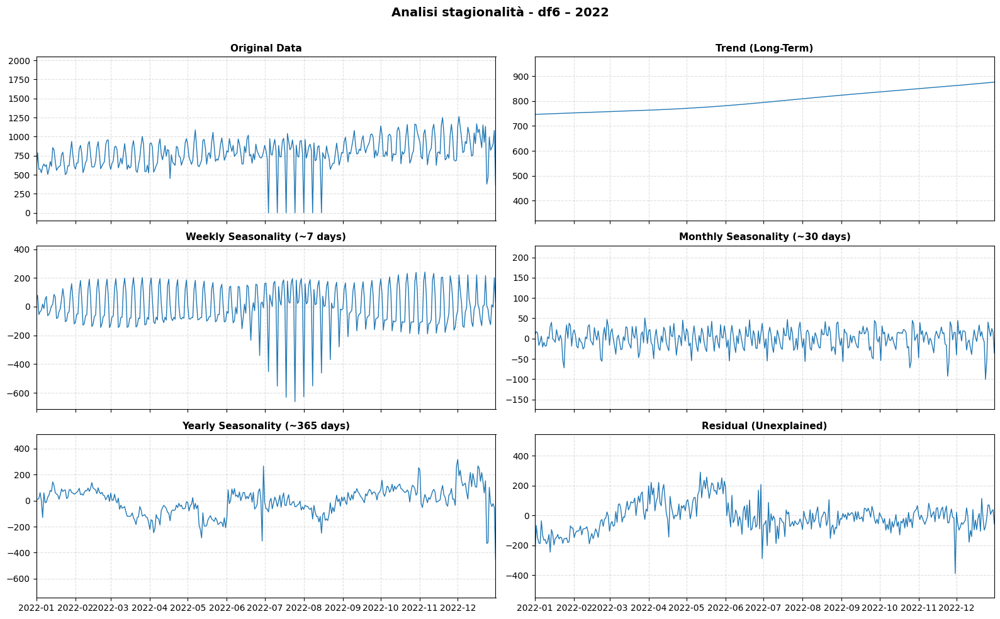

In [128]:
for name, d in dfs.items():
    if name != 'df6':
        start = "2018-09-01"
    else:
        start = "2019-09-01"
        
    analyze_multiseasonality(
            d,
            value_col="scontrini",
            date_col="data",
            start_date=start,
            year=2022,
            title=f"Analisi stagionalità - {name}"
    )

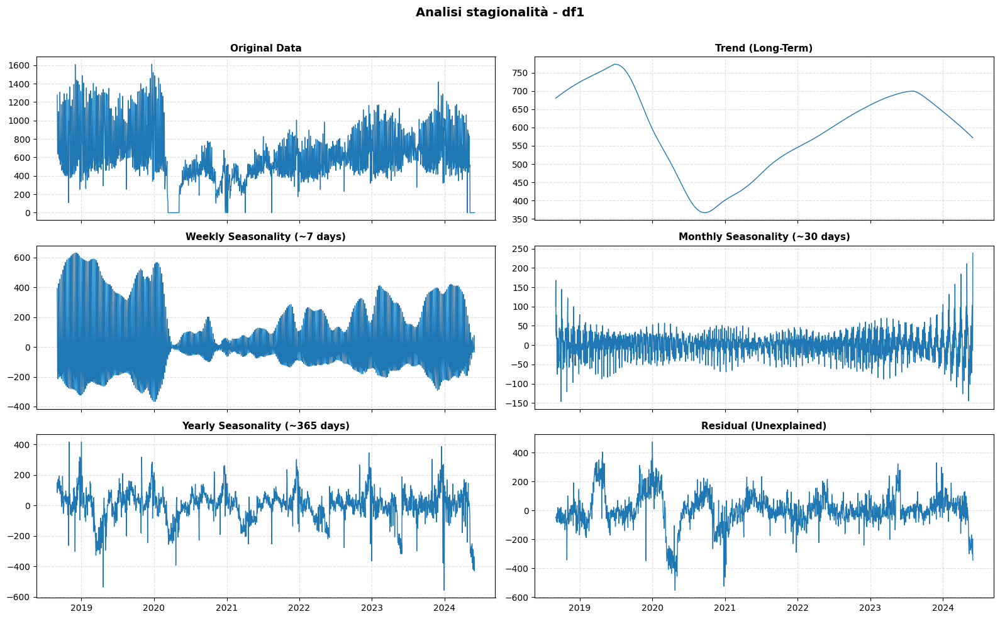

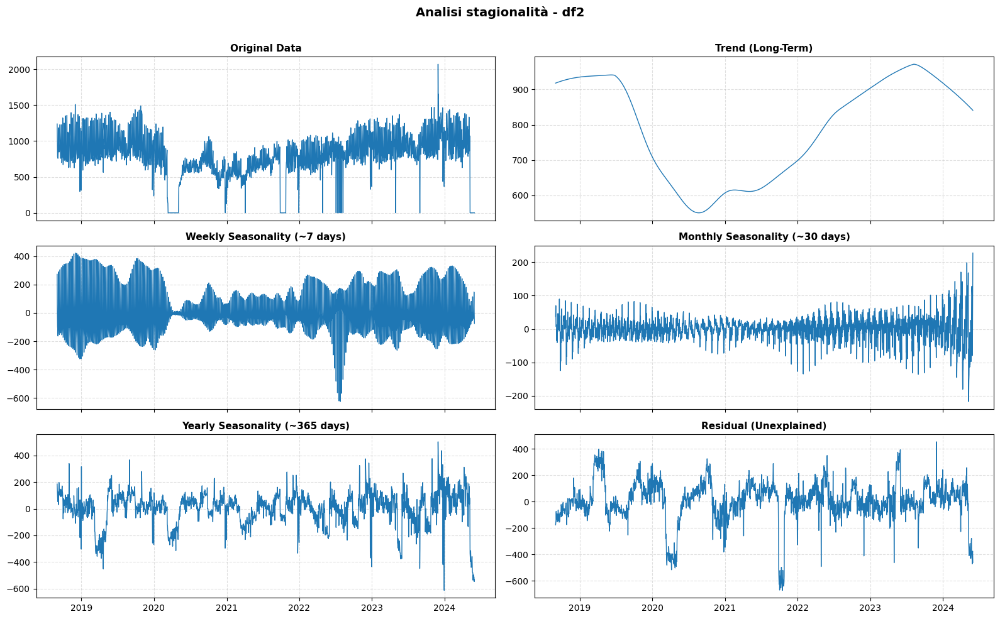

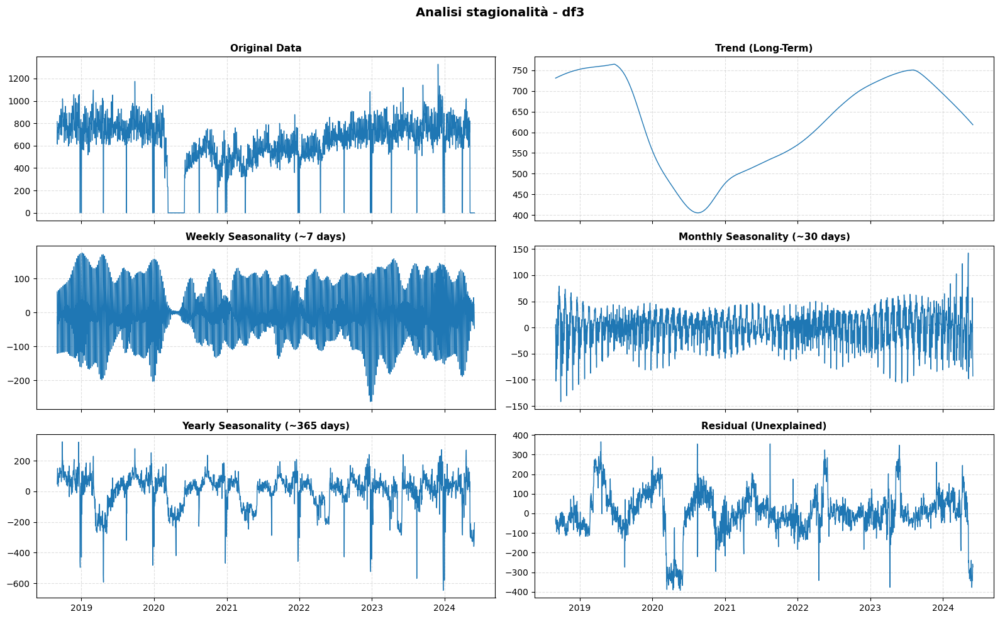

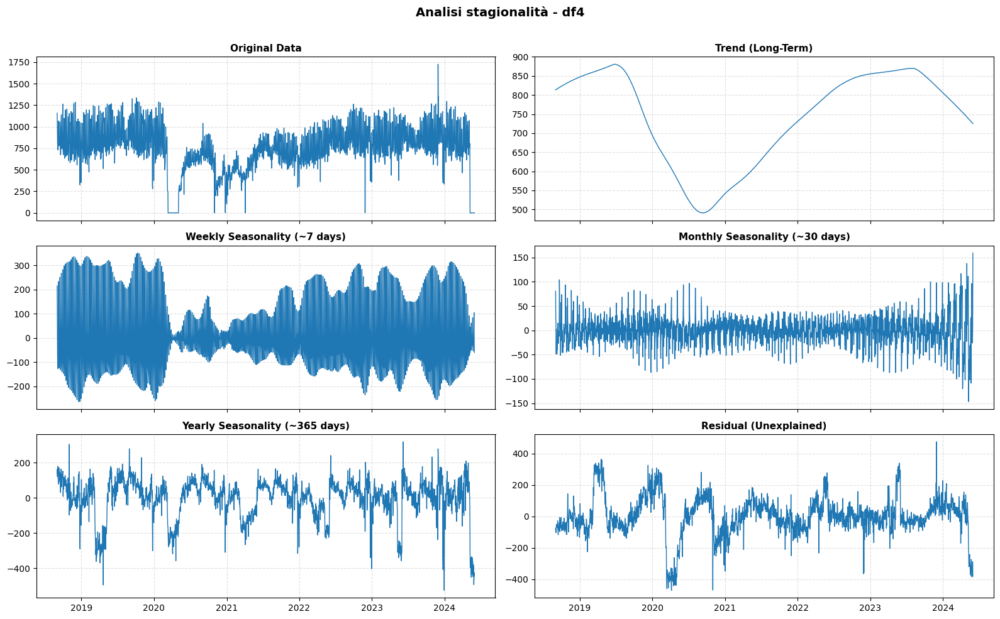

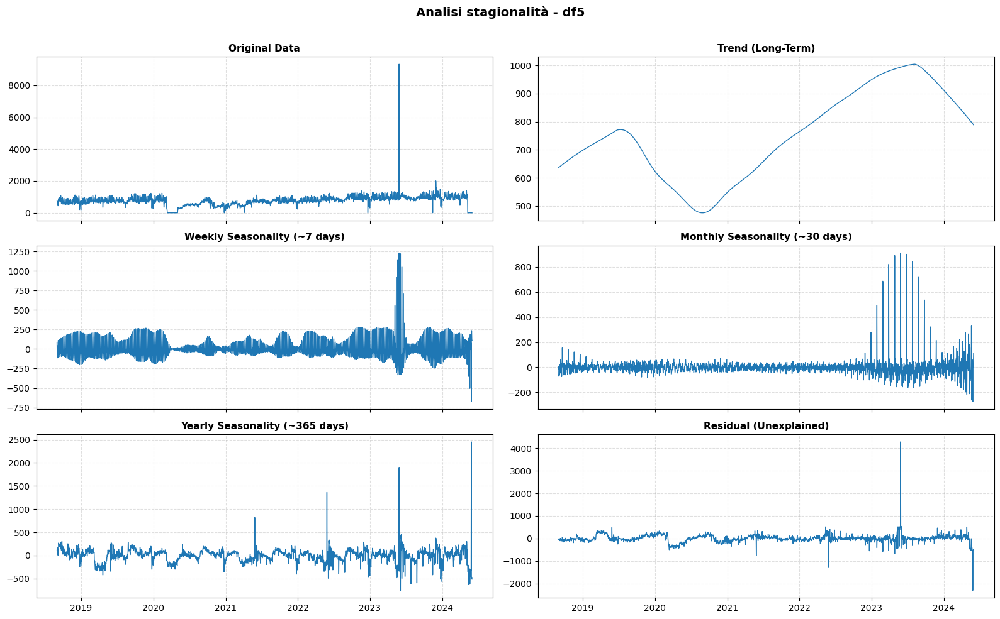

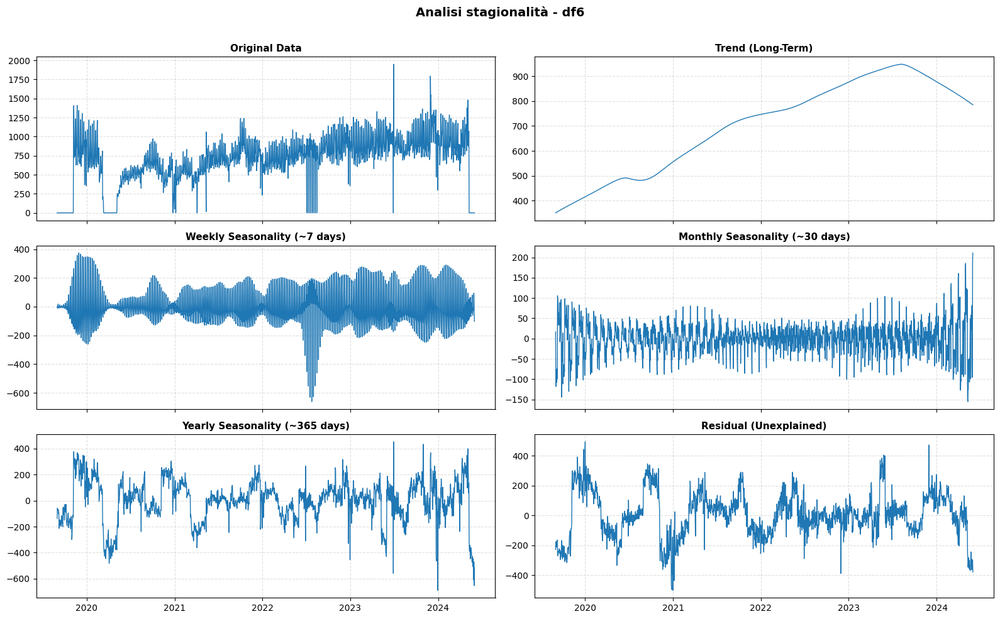

In [129]:
for name, d in dfs.items():
    if name != 'df6':
        start = "2018-09-01"
    else:
        start = "2019-09-01"
        
    analyze_multiseasonality(
            d,
            value_col="scontrini",
            date_col="data",
            start_date=start,
            title=f"Analisi stagionalità - {name}"
    )

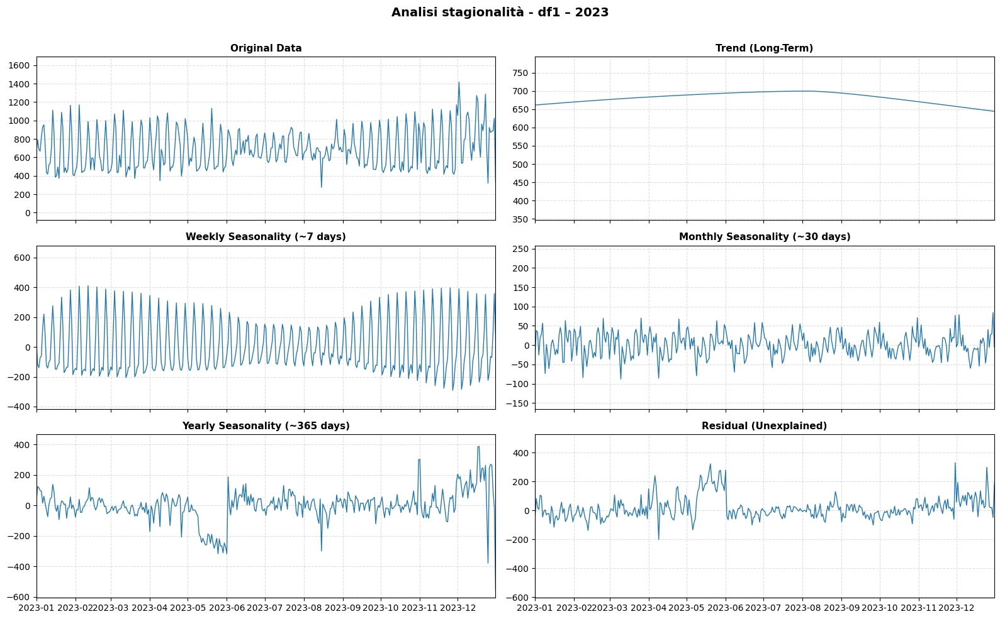

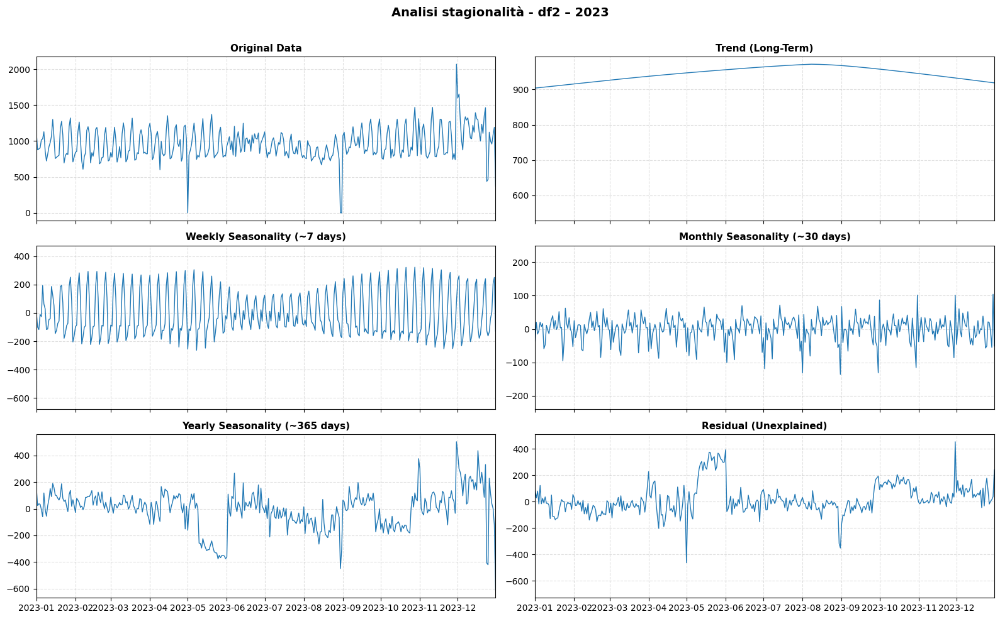

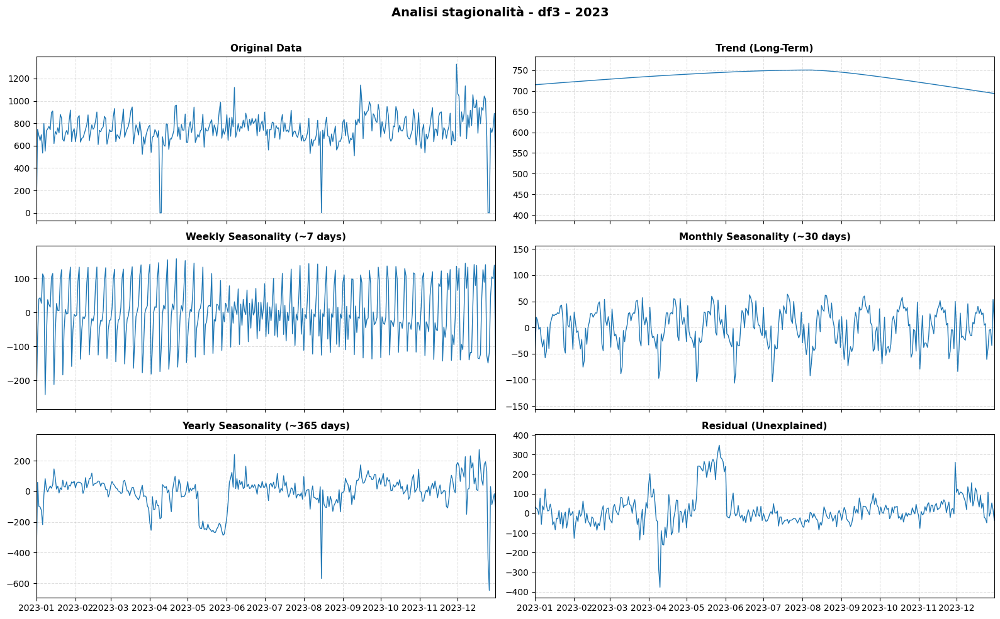

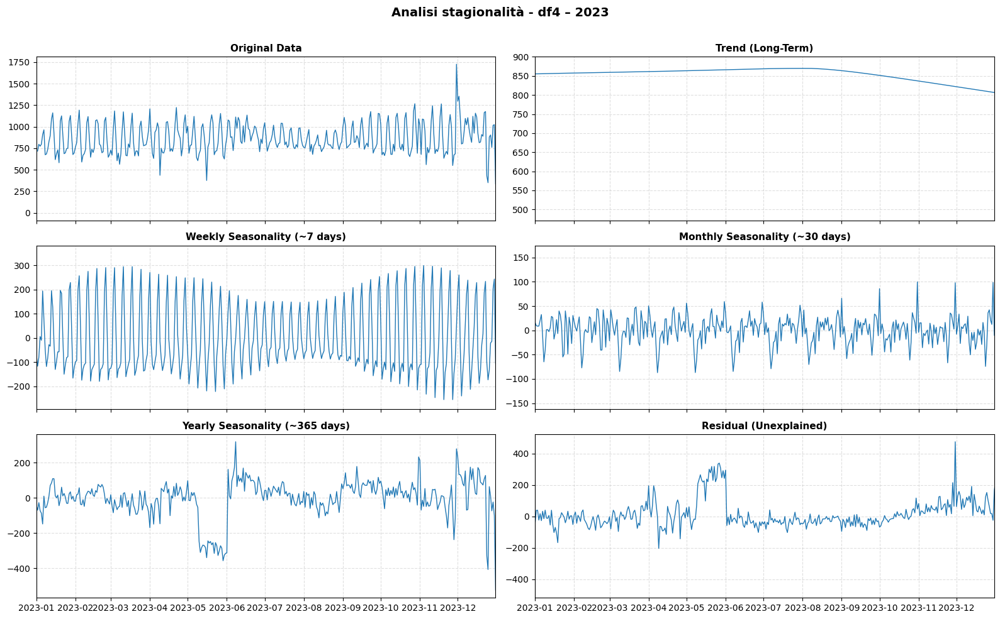

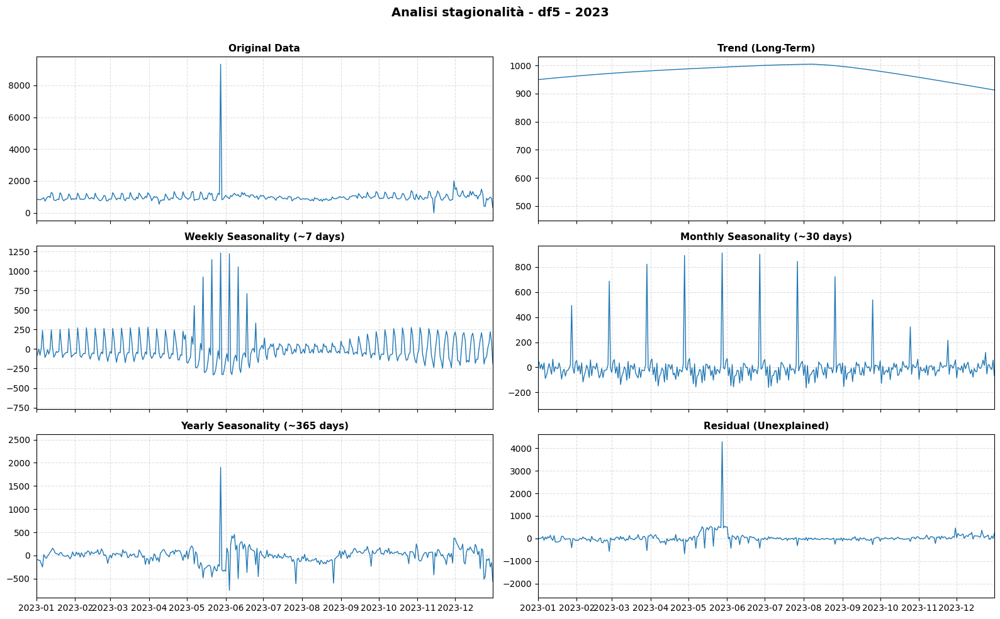

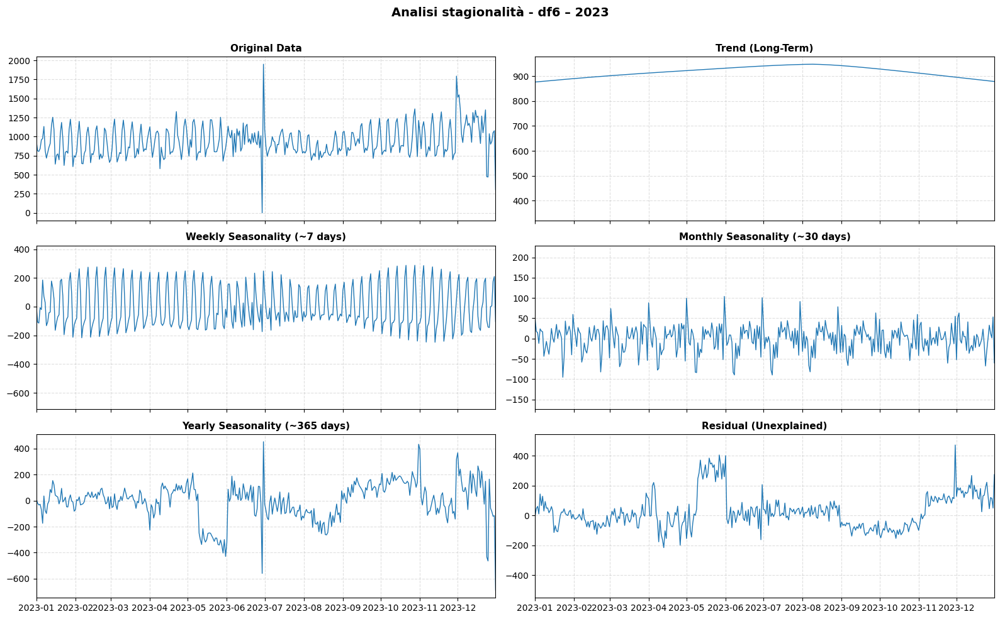

In [130]:
for name, d in dfs.items():
    if name != 'df6':
        start = "2018-09-01"
    else:
        start = "2019-09-01"
        
    analyze_multiseasonality(
            d,
            value_col="scontrini",
            date_col="data",
            start_date=start,
            year=2023,
            title=f"Analisi stagionalità - {name}"
    )

# More Analysis

In [131]:
for d in dfs.keys():
    print(dfs[d][dfs[d].data == '2021-01-01'])

      scontrini  totale ristorante  giorno  scontrino_medio       data
1096        0.0     0.0       R001  Friday              0.0 2021-01-01
      scontrini    totale ristorante  giorno  scontrino_medio       data
1096      283.0  17654.21       R002  Friday        62.382367 2021-01-01
      scontrini  totale ristorante  giorno  scontrino_medio       data
1096        8.0   39.62       R003  Friday           4.9525 2021-01-01
      scontrini   totale ristorante  giorno  scontrino_medio       data
1096      104.0  5585.74       R004  Friday        53.709038 2021-01-01
      scontrini   totale ristorante  giorno  scontrino_medio       data
1096      164.0  9486.67       R005  Friday        57.845549 2021-01-01
      scontrini   totale ristorante  giorno  scontrino_medio       data
1096       49.0  2356.22       R067  Friday        48.086122 2021-01-01


In [132]:
df[df.scontrini == 0].to_csv('closure.csv')

# Lockdown regressors

In [133]:
df_lck = pd.read_csv('lockdown_emilia.csv')
df_lck.Data = pd.to_datetime(df_lck.Data, format='mixed')
df_lck.head()

,Data,Zona/Fase,Consumazione al tavolo,Asporto,Delivery,Nota sintetica
0,2020-01-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID
1,2020-02-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID
2,2020-03-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID
3,2020-04-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID
4,2020-05-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID


In [134]:
df_lck.groupby(['Zona/Fase', 'Consumazione al tavolo', 'Asporto', 'Delivery']).size()

Zona/Fase                              Consumazione al tavolo                        Asporto                       Delivery                           
Fase 2 (no colori)                     Vietato                                       Consentito (fino alle 22)     Consentito (senza limiti)               14
Festività nazionali (rosse/arancioni)  Vietato                                       Consentito (fino alle 22)     Consentito (senza limiti)               17
Italia zona protetta                   Consentito fino alle 18                       Vietato                       Vietato/non specificato                  4
Lockdown nazionale                     Vietato                                       Vietato                       Consentito (senza limiti di orario)     53
Misure nazionali (pre-colori)          Consentito fino alle 18                       Consentito (fino alle 24)     Consentito (senza limiti)               13
Pre-lockdown                           Consentito (orari no

In [135]:
mapping = {
    'Fase 2 (no colori)': 'takeaway_only',
    'Festività nazionali (rosse/arancioni)': 'takeaway_only',
    'Italia zona protetta': 'restricted_open',
    'Lockdown nazionale': 'delivery_only',
    'Misure nazionali (pre-colori)': 'restricted_open',
    'Pre-lockdown': 'full_open',
    'Riapertura controllata': 'full_open',
    'Zona arancione': 'takeaway_only',
    'Zona bianca': 'full_open',
    'Zona gialla (solo all’aperto, fino alle 22)': 'restricted_open',
    'Zona gialla (anche al chiuso, fino alle 23-24)': 'full_open',
    'Zona gialla (fino alle 18)': 'restricted_open',
    'Zona rossa': 'takeaway_only'
}

df_lck['macro_fase'] = df_lck['Zona/Fase'].map(mapping)

In [136]:
pd.get_dummies(df_lck['macro_fase'], prefix='dummy_emilia').head()

,dummy_emilia_delivery_only,dummy_emilia_full_open,dummy_emilia_restricted_open,dummy_emilia_takeaway_only
0,False,True,False,False
1,False,True,False,False
2,False,True,False,False
3,False,True,False,False
4,False,True,False,False


In [137]:
dummies = pd.get_dummies(df_lck['macro_fase'], prefix='dummy_emilia', drop_first=True).astype(int)
df_lck = pd.concat([df_lck, dummies], axis=1)
df_lck.head()

,Data,Zona/Fase,Consumazione al tavolo,Asporto,Delivery,Nota sintetica,macro_fase,dummy_emilia_full_open,dummy_emilia_restricted_open,dummy_emilia_takeaway_only
0,2020-01-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0
1,2020-02-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0
2,2020-03-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0
3,2020-04-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0
4,2020-05-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0


In [138]:
df_lck2 = pd.read_csv('lockdown_lombardia.csv')
df_lck2.Data = pd.to_datetime(df_lck2.Data, format='mixed')

df_lck2['macro_fase'] = df_lck2['Zona/Fase'].map(mapping)
dummies = pd.get_dummies(df_lck2['macro_fase'], prefix='dummy_lombardia', drop_first=True).astype(int)

df_lck = pd.concat([df_lck, dummies], axis=1)
df_lck

,Data,Zona/Fase,Consumazione al tavolo,Asporto,Delivery,Nota sintetica,macro_fase,dummy_emilia_full_open,dummy_emilia_restricted_open,dummy_emilia_takeaway_only,dummy_lombardia_full_open,dummy_lombardia_restricted_open,dummy_lombardia_takeaway_only
0,2020-01-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0,1,0,0
1,2020-02-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0,1,0,0
2,2020-03-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0,1,0,0
3,2020-04-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0,1,0,0
4,2020-05-03,Pre-lockdown,Consentito (orari normali),Consentito (orari normali),Consentito (nessun limite),Apertura regolare pre-COVID,full_open,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
482,2021-06-26,Zona bianca,Consentito (nessun limite),Consentito (nessun limite),Consentito (nessun limite),"Nessuna restrizione, solo norme igieniche di base",full_open,1,0,0,1,0,0
483,2021-06-27,Zona bianca,Consentito (nessun limite),Consentito (nessun limite),Consentito (nessun limite),"Nessuna restrizione, solo norme igieniche di base",full_open,1,0,0,1,0,0
484,2021-06-28,Zona bianca,Consentito (nessun limite),Consentito (nessun limite),Consentito (nessun limite),"Nessuna restrizione, solo norme igieniche di base",full_open,1,0,0,1,0,0
485,2021-06-29,Zona bianca,Consentito (nessun limite),Consentito (nessun limite),Consentito (nessun limite),"Nessuna restrizione, solo norme igieniche di base",full_open,1,0,0,1,0,0


In [145]:
df_lck = df_lck.iloc[:, [0, 7, 8, 9, 10, 11, 12]]
df_lck.head()

,Data,dummy_emilia_full_open,dummy_emilia_restricted_open,dummy_emilia_takeaway_only,dummy_lombardia_full_open,dummy_lombardia_restricted_open,dummy_lombardia_takeaway_only
0,2020-01-03,1,0,0,1,0,0
1,2020-02-03,1,0,0,1,0,0
2,2020-03-03,1,0,0,1,0,0
3,2020-04-03,1,0,0,1,0,0
4,2020-05-03,1,0,0,1,0,0


In [146]:
default_values = {
    'dummy_emilia_full_open': 1,
    'dummy_emilia_restricted_open': 0,
    'dummy_emilia_takeaway_only': 0,
    'dummy_lombardia_full_open': 1,
    'dummy_lombardia_restricted_open': 0,
    'dummy_lombardia_takeaway_only': 0
}

In [172]:
os.makedirs('data', exist_ok=True)

In [173]:
i = 1
for k in dfs.keys():
    d = dfs[k]
    merged = d.merge(df_lck, left_on='data', right_on='Data', how='left')
    merged = merged.fillna(value=default_values).drop(columns=["Data"])
    merged["is_post_covid"] = np.where(merged["data"] >= "2021-06-15", 1, 0)
    merged.drop(columns=['ristorante'], inplace=True)
   
    last_valid_index = merged.dropna(how="all").index[-1]
    last_valid_index = merged[merged.totale != 0].index[-1]
    merged = merged.loc[:last_valid_index]
    
    merged = merged[merged.data >= '2018-09-01']
    
    if i == 6:
        first_valid_index = merged.dropna(how="all").index[0]
        first_valid_index = merged[merged.totale != 0].index[0]
        merged = merged.loc[first_valid_index:]
    
    merged.to_csv(f'data/restaurant_{i}.csv')
    i+=1

In [170]:
dfs['df6']

,scontrini,totale,ristorante,giorno,scontrino_medio,data
0,0.0,0.0,R067,NaN,NaN,2018-01-01
1,0.0,0.0,R067,NaN,NaN,2018-01-02
2,0.0,0.0,R067,NaN,NaN,2018-01-03
3,0.0,0.0,R067,NaN,NaN,2018-01-04
4,0.0,0.0,R067,NaN,NaN,2018-01-05
...,...,...,...,...,...,...
2338,0.0,0.0,R067,Monday,0.0,2024-05-27
2339,0.0,0.0,R067,Tuesday,0.0,2024-05-28
2340,0.0,0.0,R067,Wednesday,0.0,2024-05-29
2341,0.0,0.0,R067,Thursday,0.0,2024-05-30
